In [3]:
!pip install ultralytics --quiet

In [41]:
from pathlib import Path
import os
import torch.nn as nn
import matplotlib.pyplot as plt
import random
import torch
import cv2
from ultralytics import YOLO
import glob
from PIL import Image
import numpy as np
from IPython.display import Image, display

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [21]:
data = "/content/drive/MyDrive/deep_learning/underwater-obj-detection/data/data.yaml"


In [22]:
train_path = "/content/drive/MyDrive/deep_learning/underwater-obj-detection/data/train"
val_path = "/content/drive/MyDrive/deep_learning/underwater-obj-detection/data/valid"
test_path = "/content/drive/MyDrive/deep_learning/underwater-obj-detection/data/test"

train_images = train_path + "/images"
val_images = val_path + "/images"
test_images = test_path + "/images"

train_labels = train_path + "/labels"
val_labels = val_path + "/labels"
test_labels = test_path + "/labels"




In [23]:
classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
num_classes = len(classes)
idx_to_class = {i : k for i,k in enumerate(classes)}
class_to_idx = {k: i for i, k in idx_to_class.items()}


In [24]:
class_to_idx

{'fish': 0,
 'jellyfish': 1,
 'penguin': 2,
 'puffin': 3,
 'shark': 4,
 'starfish': 5,
 'stingray': 6}

In [25]:
class_to_idx

{'fish': 0,
 'jellyfish': 1,
 'penguin': 2,
 'puffin': 3,
 'shark': 4,
 'starfish': 5,
 'stingray': 6}

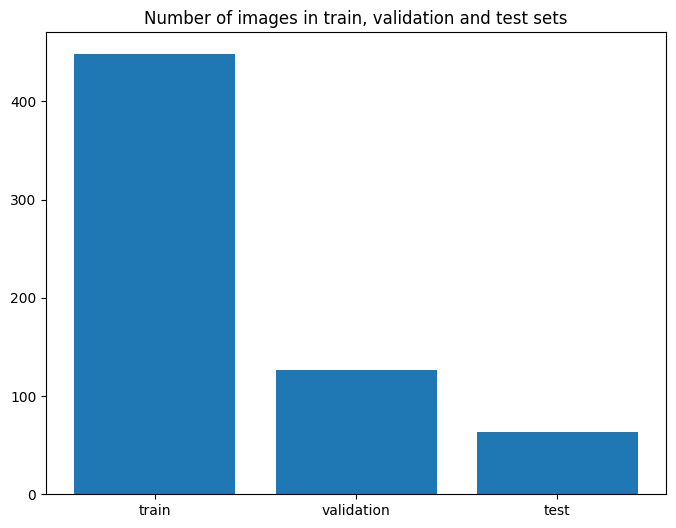

In [26]:
def plot_data(data: dict, title : str):
    plt.figure(figsize = (8,6))
    plt.bar(data.keys(), data.values())
    plt.title("Number of images in train, validation and test sets")
    plt.show()

def get_num_images(path):
    return len(os.listdir(path))

plot_data(data = {'train': get_num_images(train_images), "validation" : get_num_images(val_images), "test" : get_num_images(test_images)}, title =
          "Number of images in train, test and val splits")


In [27]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [28]:
def count_obj_per_split(image_dir, label_dir):
    object_count = {}
    total_object_count = []
    img_files = sorted(os.listdir(image_dir))
    for file in img_files:
        label_path = os.path.join(label_dir,  file[:-4] + ".txt")
        f = open(label_path, "r")
        lines = f.readlines()
        total_object_count.append(len(lines))
        for line in lines:
            object_count[(idx_to_class[int(line.split()[0])])] = object_count.get(idx_to_class[int(line.split()[0])], 0) + 1
        f.close()
    return object_count, total_object_count



In [29]:
object_counts_train, total_train_objects = count_obj_per_split(train_images, train_labels)
object_counts_val, total_val_objects = count_obj_per_split(val_images, val_labels)
object_counts_test, total_test_objects = count_obj_per_split(test_images, test_labels)

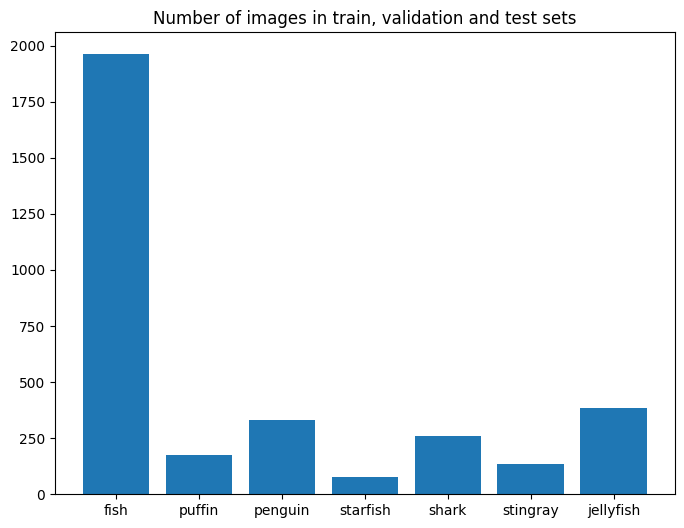

In [30]:
plot_data(object_counts_train, title = "Total instances of each class in training set")

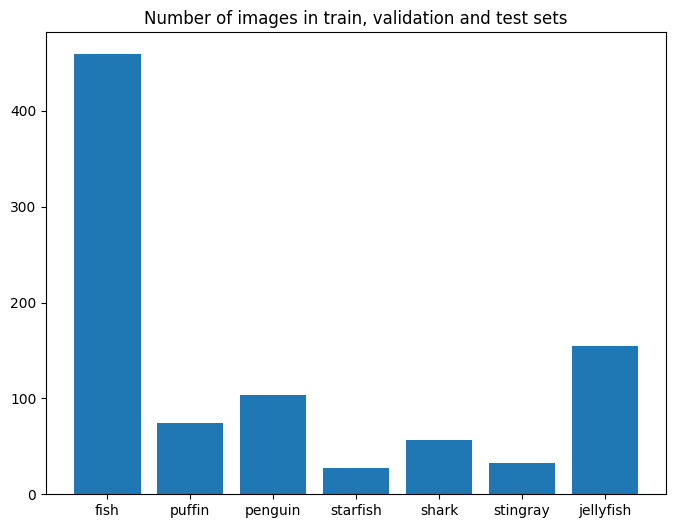

In [31]:
plot_data(object_counts_val, title = "Total instances of each class in validation set")

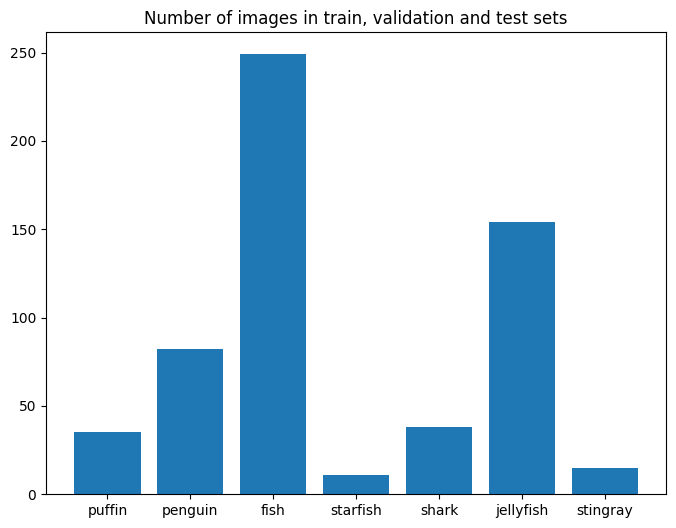

In [32]:
plot_data(object_counts_test, title = "Total instances of each class in test set")

Now we can consider the number of objects per image and visualise this in a histogram

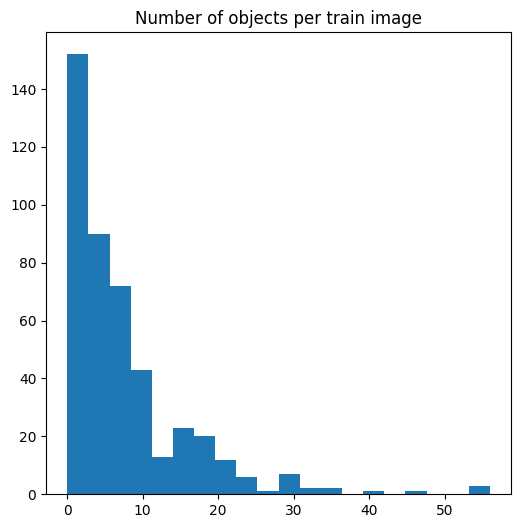

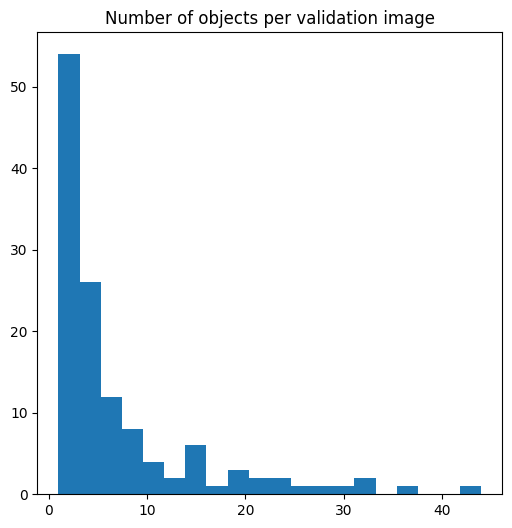

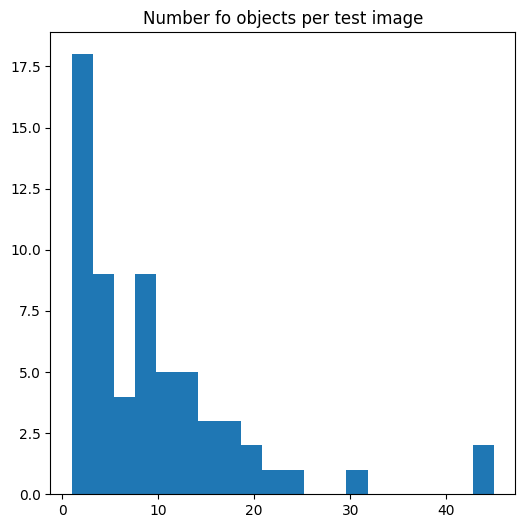

In [33]:
def plot_hist(x_var : list, title:str, bins: int = 20):
    plt.figure(figsize = (6,6))
    plt.hist(x = x_var, bins = bins)
    plt.title(title)
    plt.show()

plot_hist(total_train_objects, "Number of objects per train image")
plot_hist(total_val_objects, "Number of objects per validation image")
plot_hist(total_test_objects, "Number fo objects per test image")

Now,we can also visualise the bounding box sizes on average in the training, test and validation sets.

In [34]:
def bounding_box_sizes(image_dir, label_dir):
    sizes = []
    image_files = sorted(os.listdir(image_dir))
    for image in image_files:
        label_path = os.path.join(label_dir, image[:-4] + ".txt")
        f = open(label_path, "r")
        lines = f.readlines()
        for line in lines:
            sizes.append(float(line.split()[3]) * float(line.split()[4]))
        f.close()

    return sizes

In [35]:
train_sizes = bounding_box_sizes(train_images, train_labels)
val_sizes = bounding_box_sizes(val_images, val_labels)
test_sizes = bounding_box_sizes(test_images, test_labels)

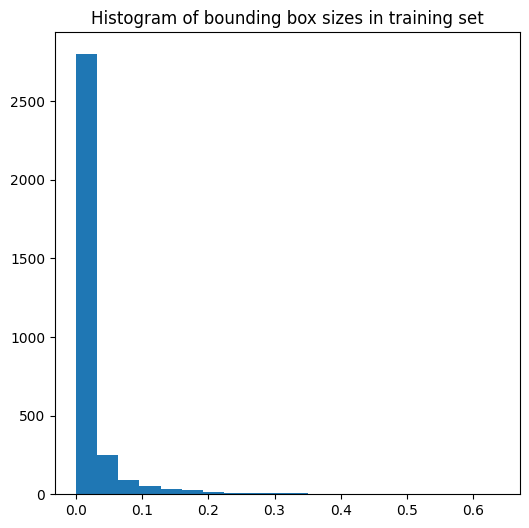

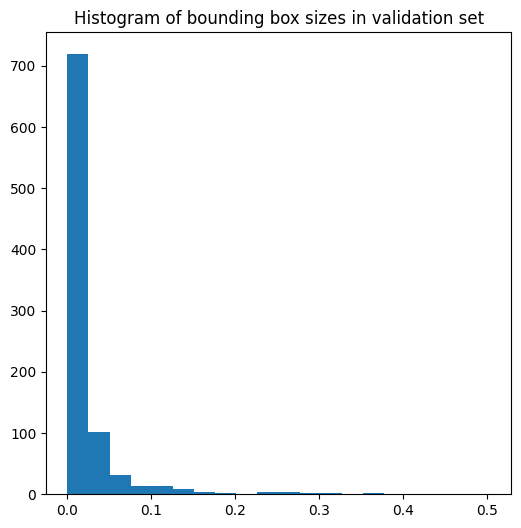

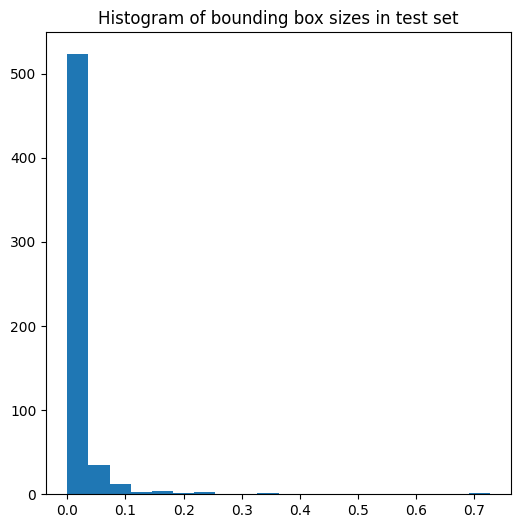

In [36]:
plot_hist(train_sizes, title = "Histogram of bounding box sizes in training set")
plot_hist(val_sizes, "Histogram of bounding box sizes in validation set")
plot_hist(test_sizes, "Histogram of bounding box sizes in test set")

In [37]:
def images_with_bbox_annots(image_dir, label_dir):
    image_files = sorted(os.listdir(image_dir))

    sample_images = random.sample(image_files, 12)

    fig, axs = plt.subplots(4,3, figsize = (15,20))

    for i, image in enumerate(sample_images):
        image_path = os.path.join(image_dir, image)
        label_path = os.path.join(label_dir, image[:-4] + ".txt")
        f = open(label_path)

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for line in f:
            class_id, x_center, y_center, width, height = map(float, line.split())
            h, w, _ = image.shape
            x_min = int((x_center - width / 2) * w)
            y_min = int((y_center - height / 2) * h)
            x_max = int((x_center + width / 2) * w)
            y_max = int((y_center + height / 2) * h)

            cv2.rectangle(image, (x_min,y_min), (x_max, y_max), (255,0,0), 2)
            cv2.putText(image, idx_to_class[int(class_id)],
                        (x_min, y_min), cv2.FONT_HERSHEY_SIMPLEX,
                        fontScale = 1, color = (255,255,255), thickness = 3)
        row = i // 3
        col = i % 3

        axs[row, col].imshow(image)
        axs[row, col].axis("off")
    plt.show()


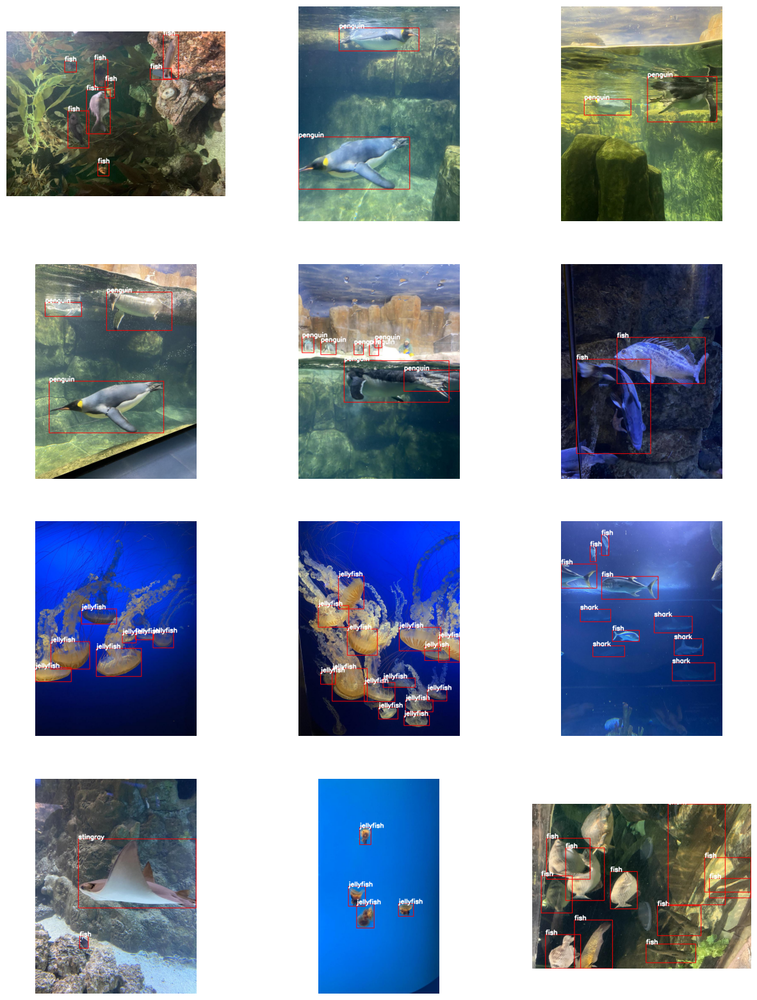

In [38]:
images_with_bbox_annots(train_images, train_labels)

In [39]:
model = YOLO("yolo26n.pt")

In [50]:
results = model.train(data = data, epochs = 150, batch = 16, device = device)

Ultralytics 8.4.10 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/deep_learning/underwater-obj-detection/data/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train2, nbs=64, nms=False, opset=None,

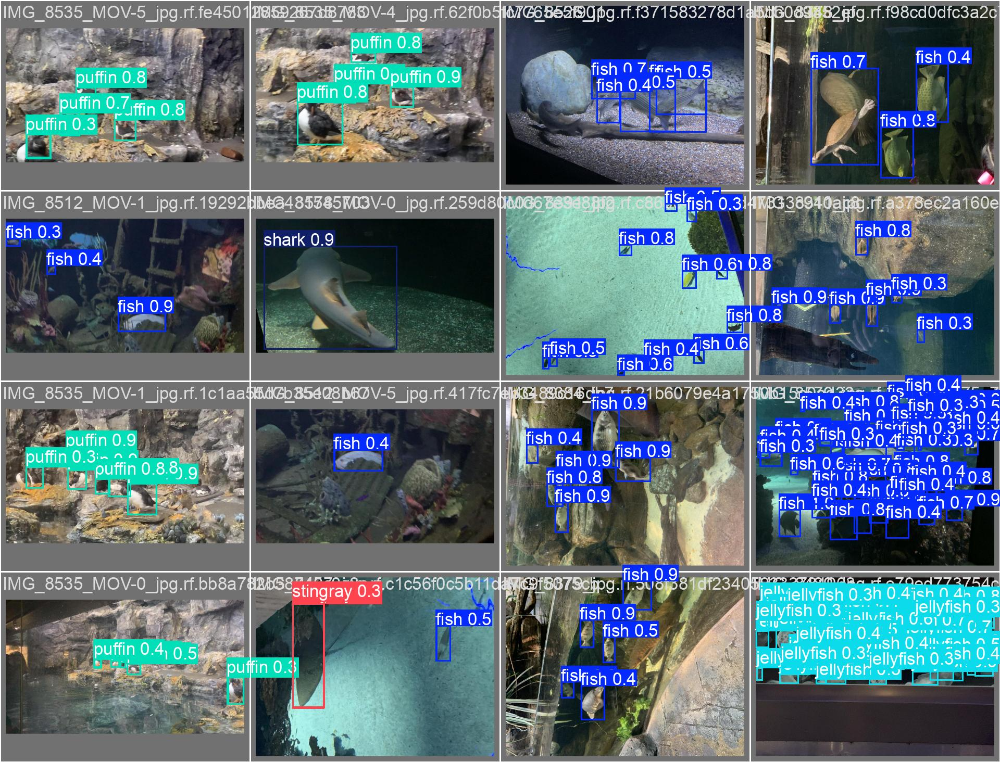

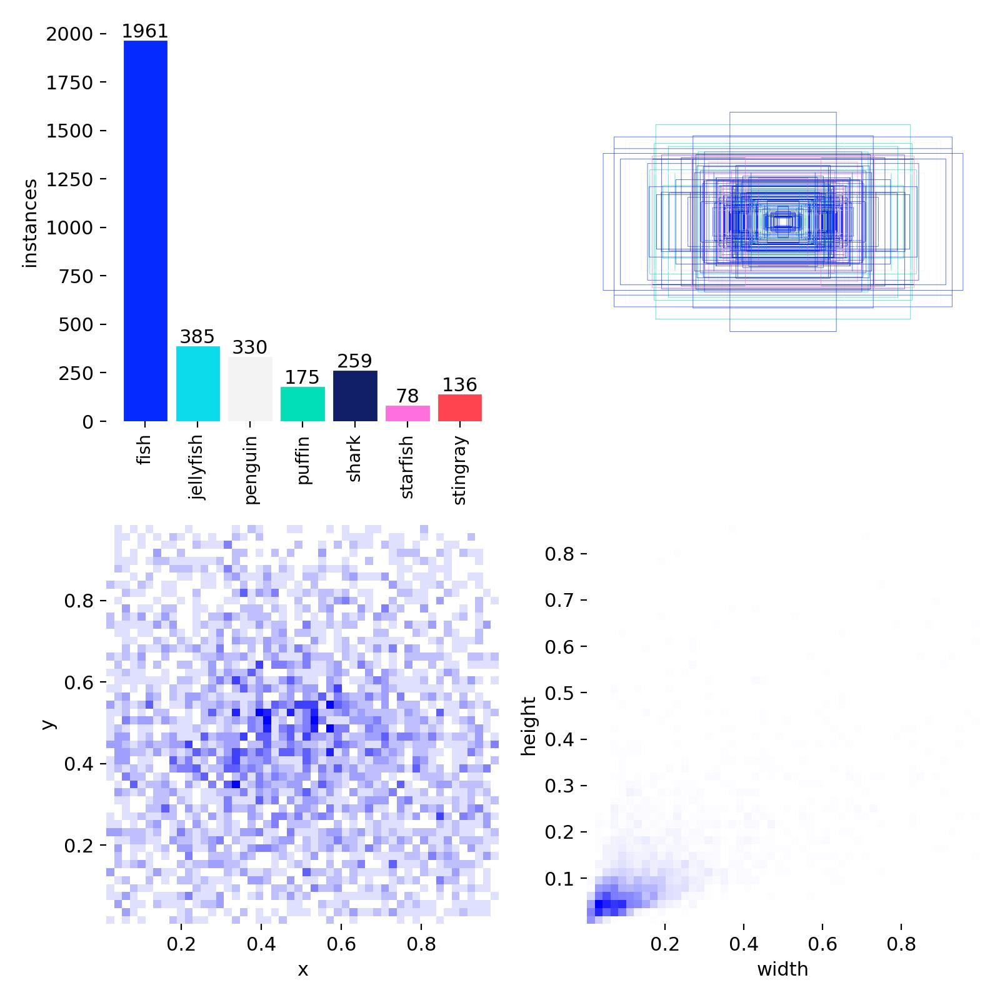

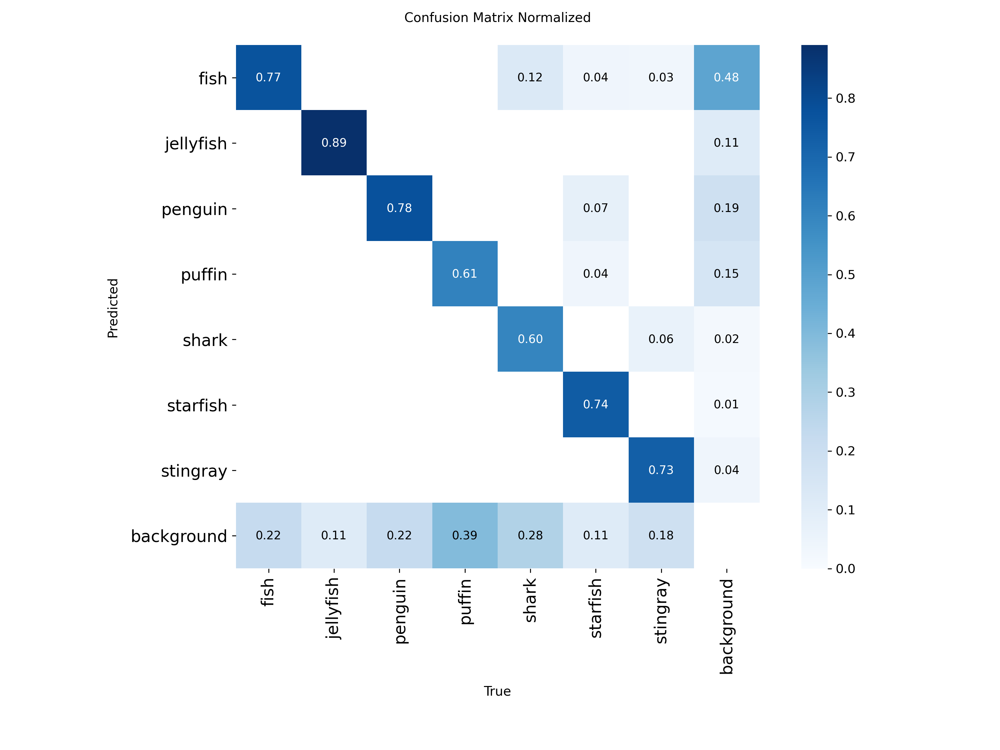

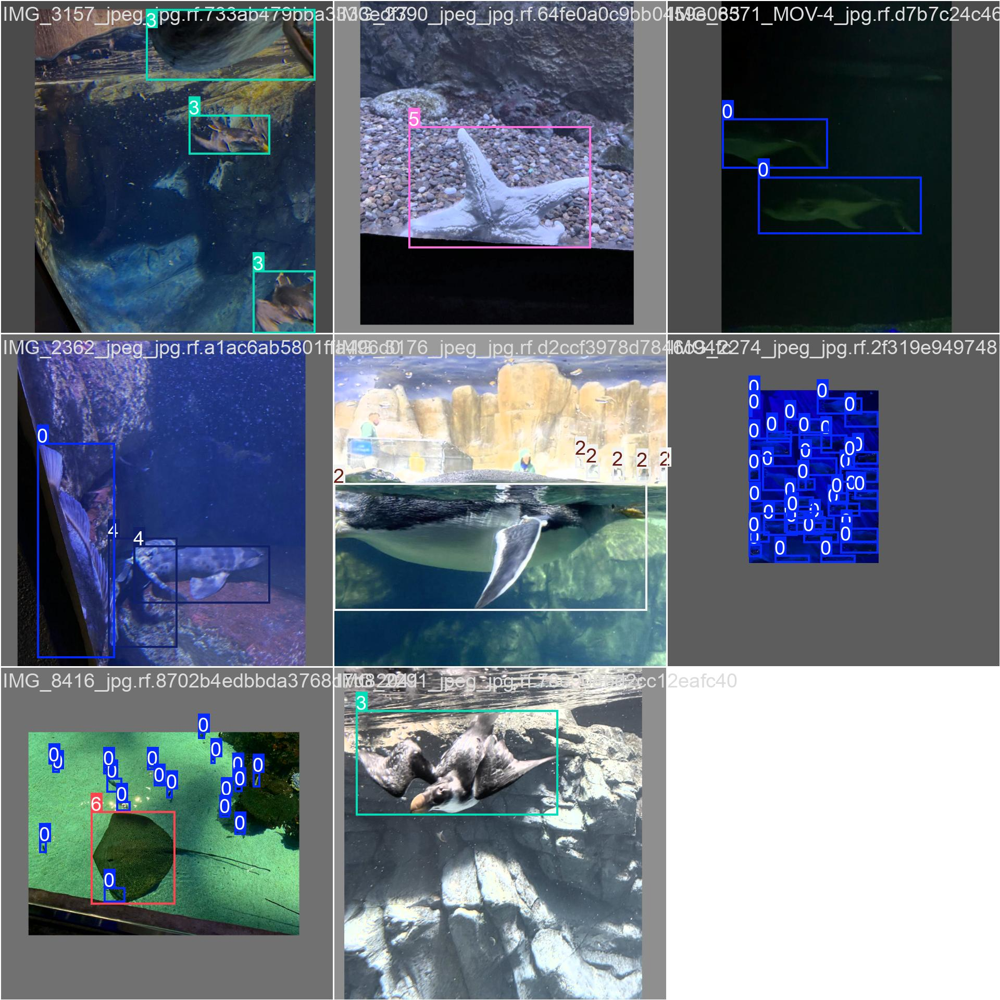

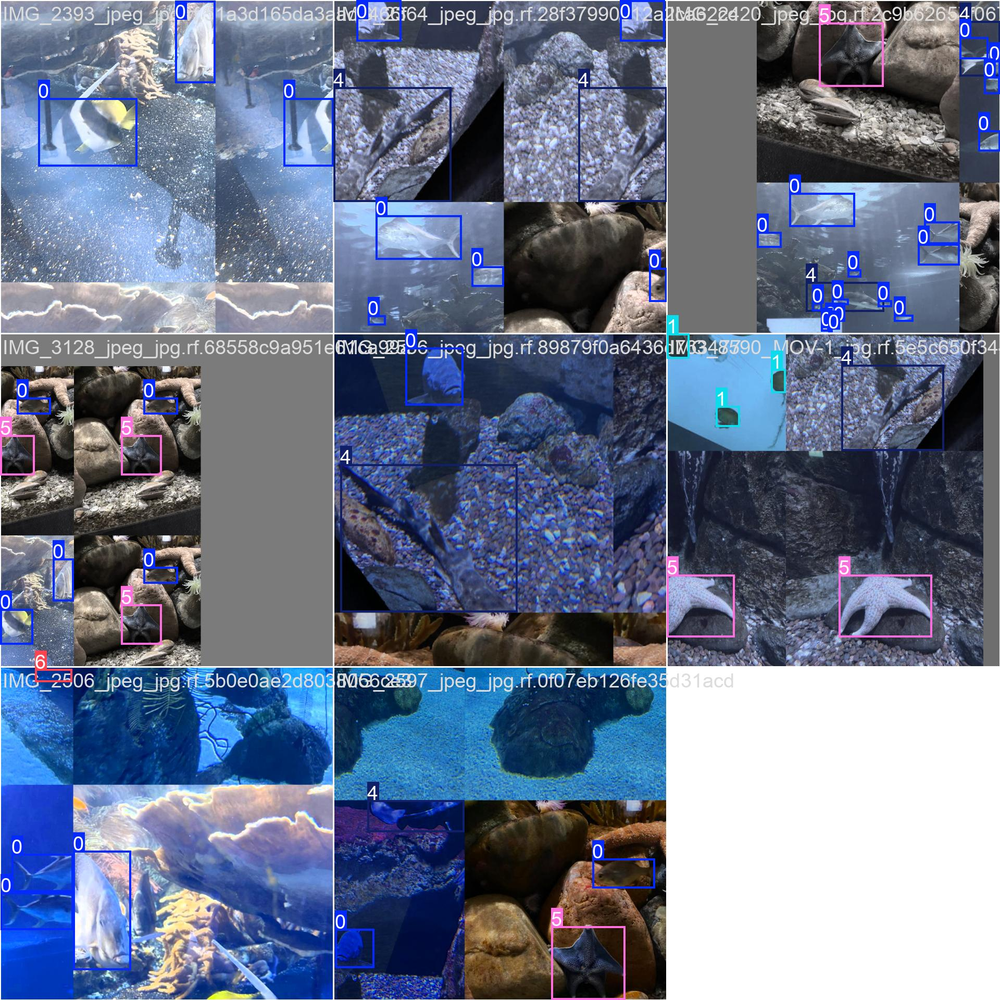

...

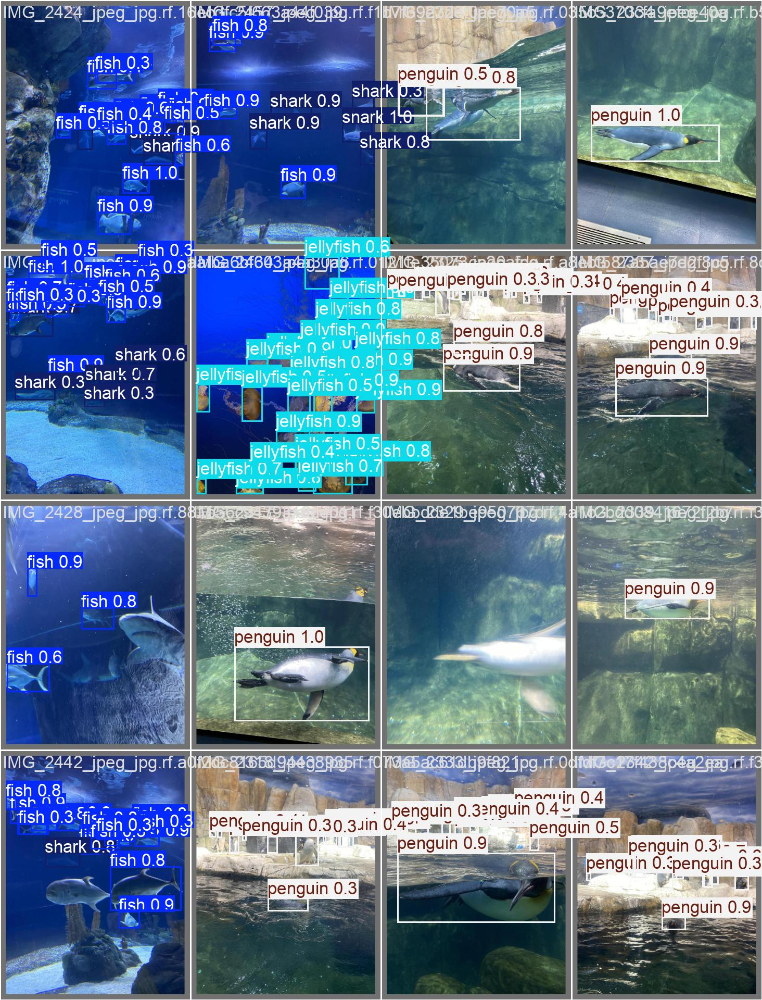

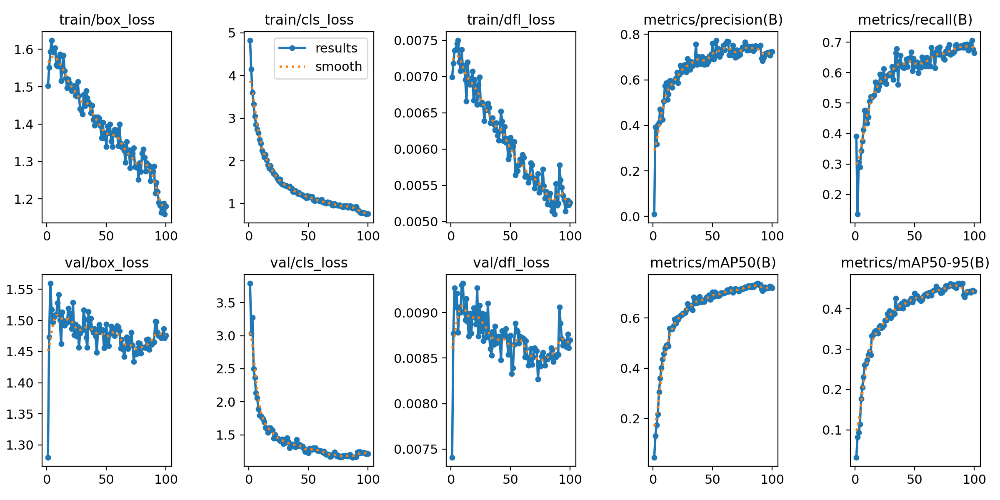

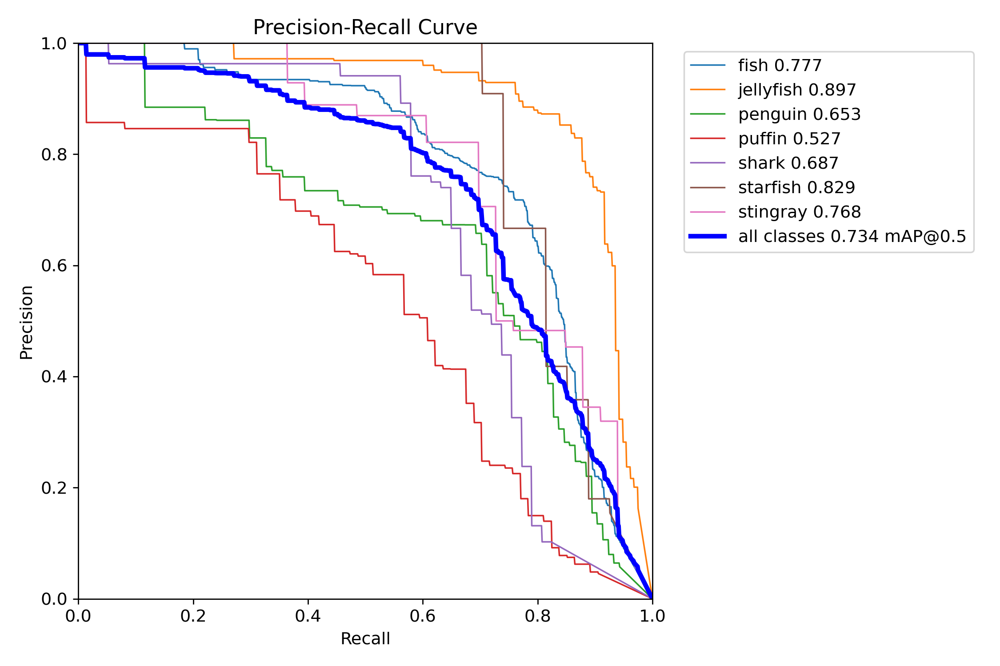

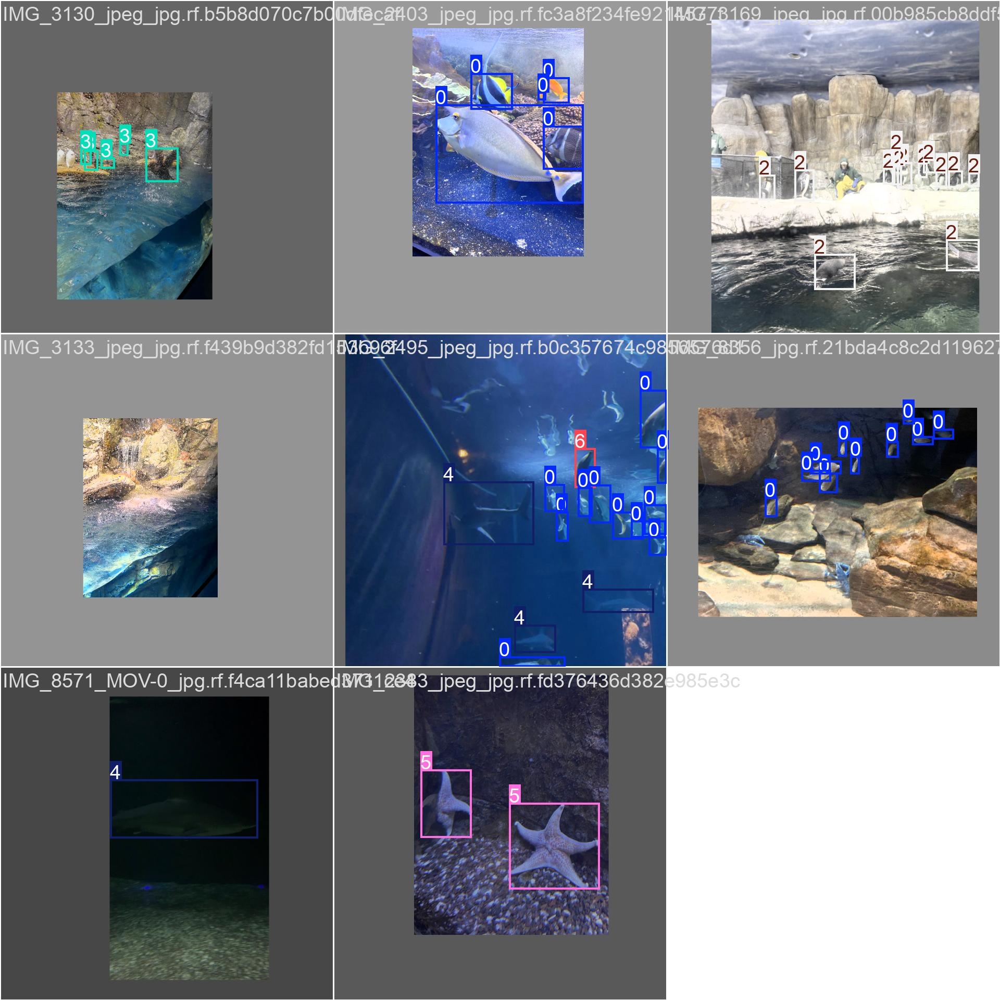

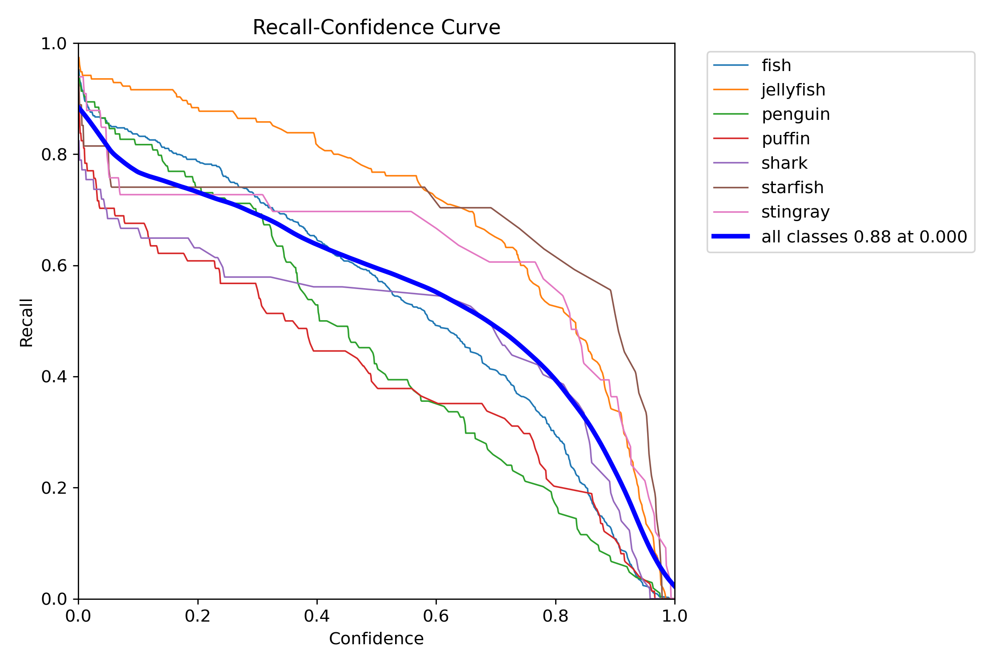

In [51]:
path = '/content/runs/detect/train'
image = [f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]
for i in range(len(image)):
  display(Image(filename = path + '/' + image[i]))


image 1/1 /content/drive/MyDrive/deep_learning/underwater-obj-detection/data/test/images/IMG_8582_MOV-0_jpg.rf.aa8304d7a5112d63c8841d96160d42cd.jpg: 640x384 9 fishs, 1 stingray, 21.1ms
Speed: 2.7ms preprocess, 21.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)


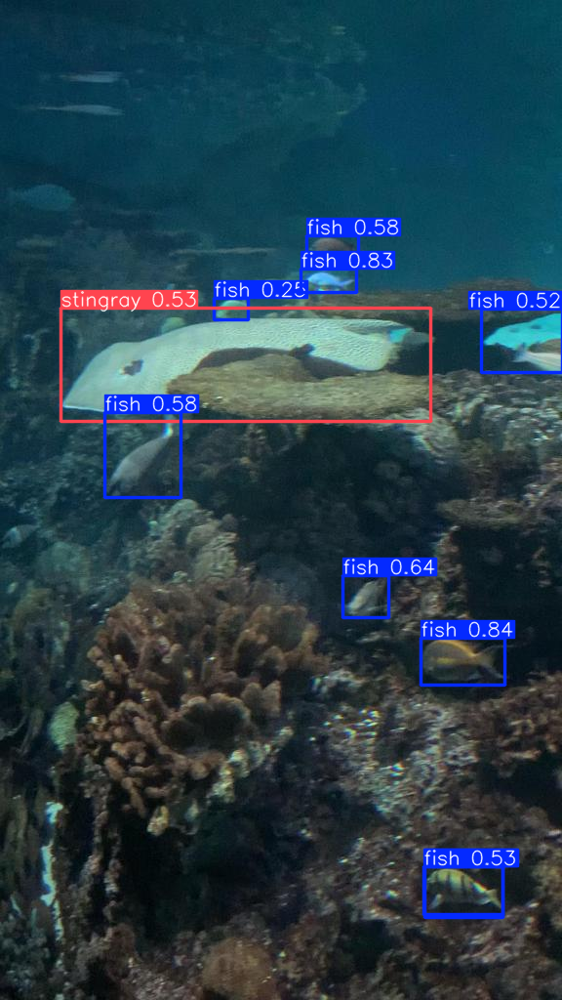

In [49]:
model = YOLO('/content/runs/detect/train/weights/best.pt')
results = model.predict(os.path.join(test_images, "IMG_8582_MOV-0_jpg.rf.aa8304d7a5112d63c8841d96160d42cd.jpg"))

results[0].show()